## Importing Data (done)

In [5]:
import pandas as pd
import numpy as np
import math
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.widgets import Slider, RadioButtons
from pygris import counties

# For pop-up interactive plots use:
#matplotlib.use('TkAgg')

sns.set_style("whitegrid")

Import the data used for visualization.

In [6]:
# Years for data visualization will exclude 2020 election
year_list = [2008, 2012, 2016]

# Dictionary containing data by year
datayear = {}
for year in year_list:
    datayear[year] = pd.read_csv(f"clean_data/data{year}.csv")
    
# DataFrame with combined years 2008, 2012, 2016    
data = pd.concat( [datayear[year] for year in year_list] , axis=0, ignore_index=True  )

In [7]:
# Add a column stating the winning party, used to hue plots
for i in range(len(data)):
    if data.loc[i,'repub'] > data.loc[i,'dem']:
        data.loc[i,'Party'] = 'Republican'
    else:
        data.loc[i,'Party'] = 'Democrat'

## Interactive Plots of Features (done)

This interactive pie chart shows the percentage of total votes each party obtained, for counties above a certain population density.

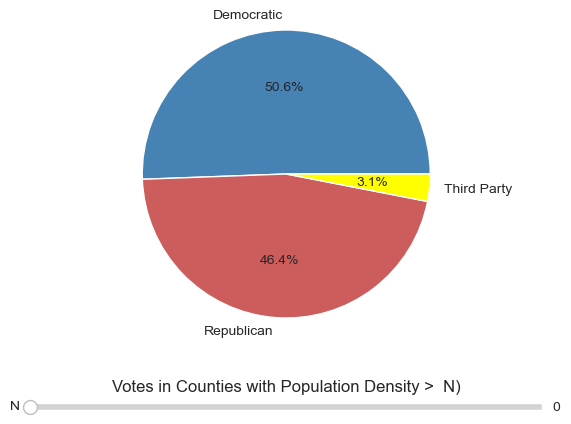

In [9]:
# Create subplots
fig, ax = plt.subplots(2)

# Initial pie chart values
initial_values = [ data['dem'].sum(), data['repub'].sum(), data['other'].sum()]
labels = ['Democratic', 'Republican', 'Third Party']
colors = ['steelblue', 'indianred', 'yellow']

# Initial pie chart
ax[0].pie(initial_values, labels=labels, colors=colors, autopct='%1.1f%%', radius=1.5)
ax[0].set_position([0.25,0.4,.5,.5])

# Create the slider
ax[1].set_position([0.1, 0.15, 0.8, 0.03])
ax[1].set_title('Votes in Counties with Population Density >  N)')
risk = Slider(ax=ax[1], label='N', valinit=0, valmin=0, valmax=48500)

# Updates pie chart as slider is moved
def update(val):
    ax[0].clear()
    updated_values = [data[data['pop_density']>=val]['dem'].sum(),
                      data[data['pop_density']>=val]['repub'].sum(),
                      data[data['pop_density']>=val]['other'].sum()]
    ax[0].pie(updated_values, labels=labels, colors=colors, autopct='%1.1f%%', radius=1.5)
    fig.canvas.draw_idle()

risk.on_changed(update)

# Display the plots
plt.show()

This interactive pie chart shows the percentage of total votes each party obtained, among counties that have a black population above a certain percentage.

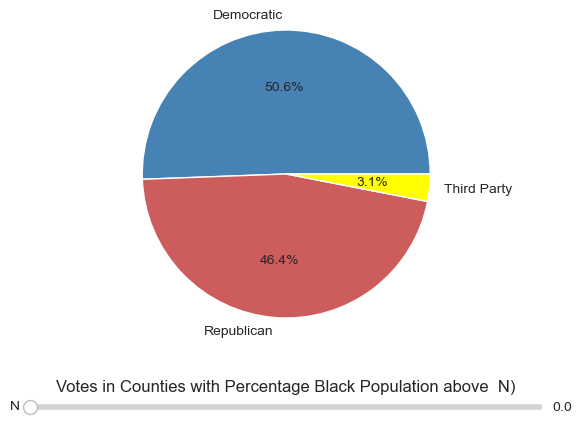

In [8]:
data['blk%'] = data['race_blk_total'] / data['pop_tot']

# Create subplots
fig, ax = plt.subplots(2)

# Initial pie chart values
initial_values = [ data['dem'].sum(), data['repub'].sum(), data['other'].sum()]
labels = ['Democratic', 'Republican', 'Third Party']
colors = ['steelblue', 'indianred', 'yellow']

# Initial pie chart
ax[0].pie(initial_values, labels=labels, colors=colors, autopct='%1.1f%%', radius=1.5)
ax[0].set_position([0.25,0.4,.5,.5])

# Create the slider
ax[1].set_position([0.1, 0.15, 0.8, 0.03])
ax[1].set_title('Votes in Counties with Percentage Black Population above  N)')
risk = Slider(ax=ax[1], label='N', valinit=0, valmin=0, valmax=0.80)

# Updates pie chart as slider is moved
def update(val):
    ax[0].clear()
    updated_values = [data[data['blk%']>=val]['dem'].sum(),
                      data[data['blk%']>=val]['repub'].sum(),
                      data[data['blk%']>=val]['other'].sum()]
    ax[0].pie(updated_values, labels=labels, colors=colors, autopct='%1.1f%%', radius=1.5)
    fig.canvas.draw_idle()

risk.on_changed(update)

# Display the plots
plt.show()


## Features against Vote Difference %

<Figure size 600x400 with 0 Axes>

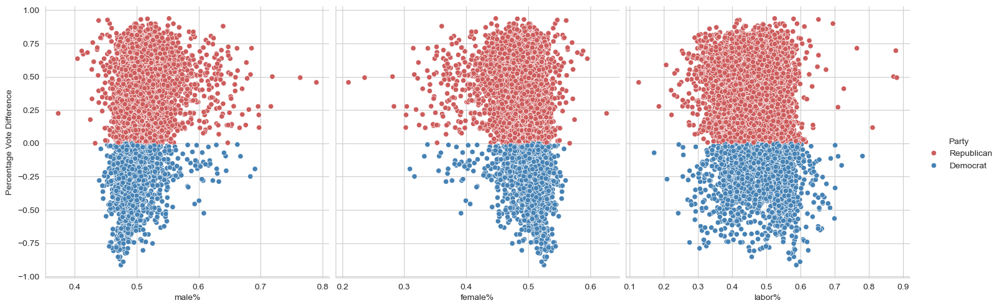

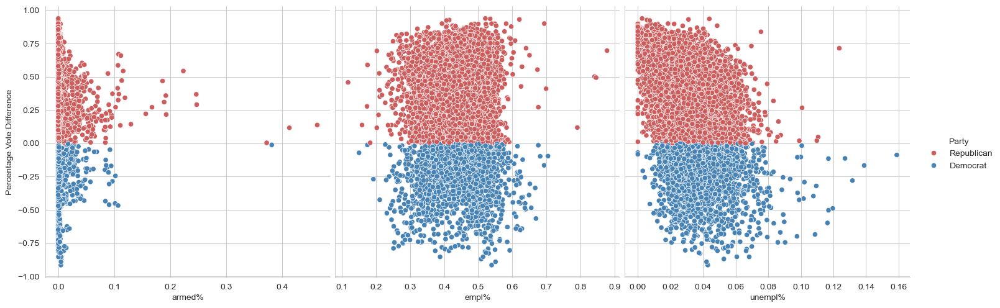

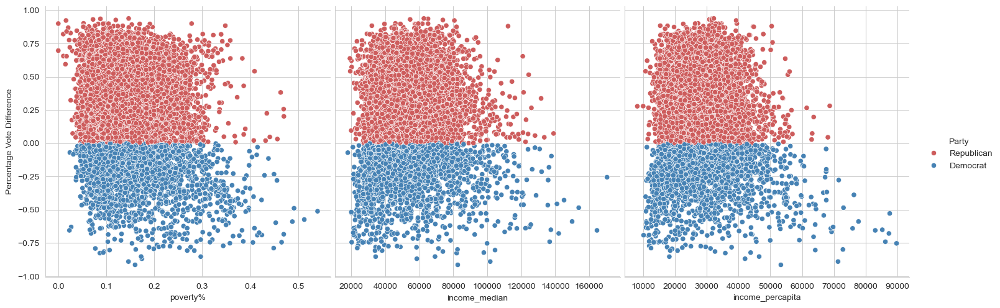

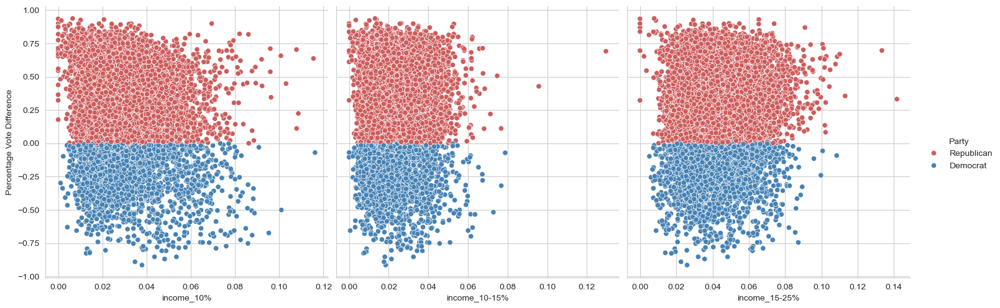

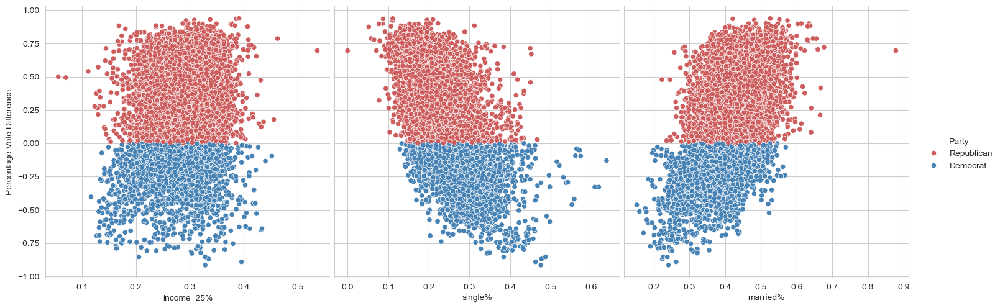

...

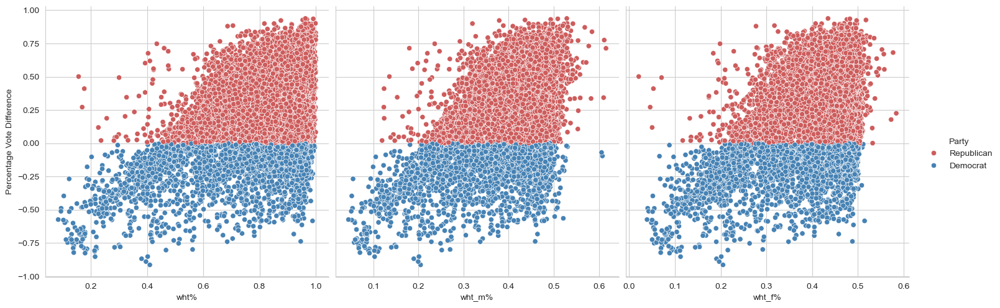

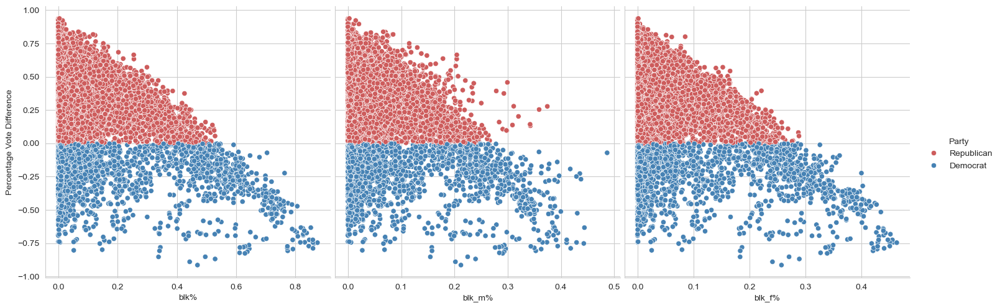

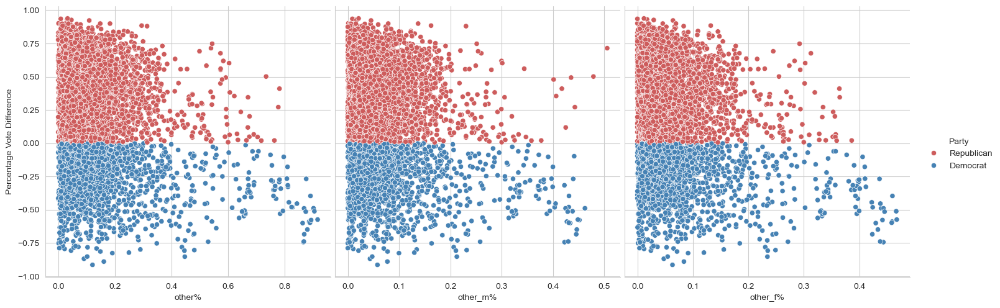

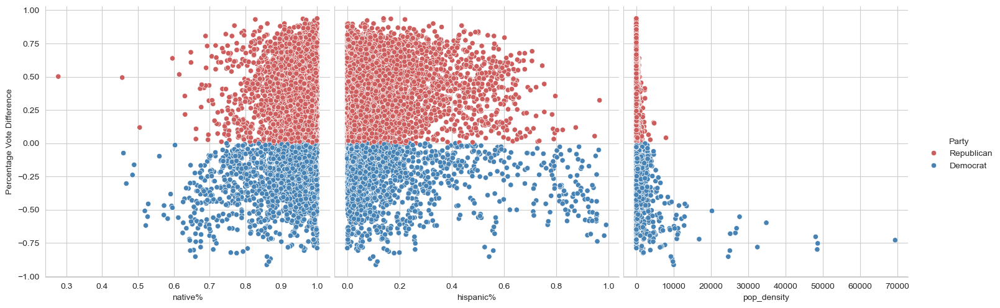

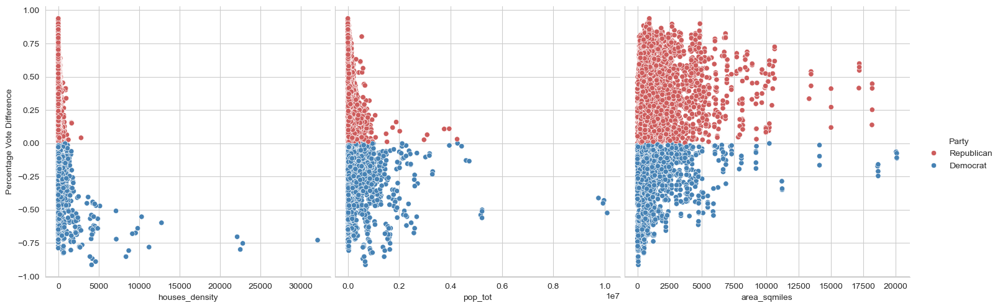

In [ ]:
plt.figure(figsize = (6, 4))

for i in range(math.floor(len(feature_list)/3)):
    sns.pairplot(   height=5,
                    data=data,
                    x_vars=[feature_list[0+3*i],feature_list[1+3*i],feature_list[2+3*i]],
                    y_vars=['vote_diff%'],
                    hue='Party',
                    palette={'Republican':'indianred','Democrat':'steelblue'},
                ).set(ylabel='Percentage Vote Difference')

## Box Plots for Feature Importance

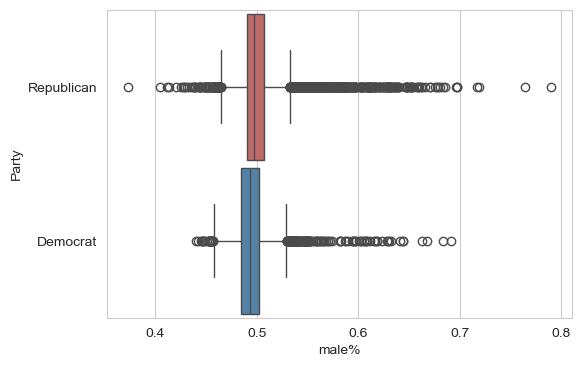

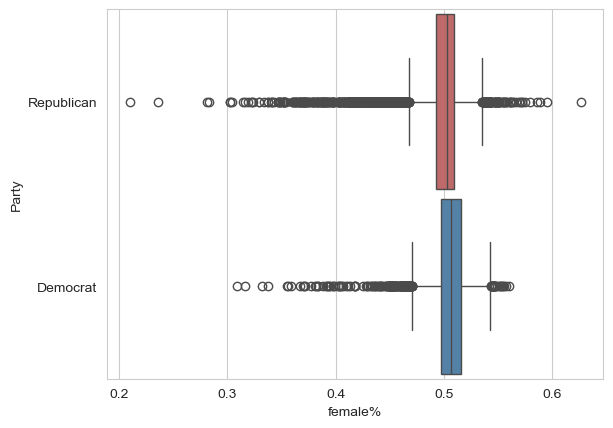

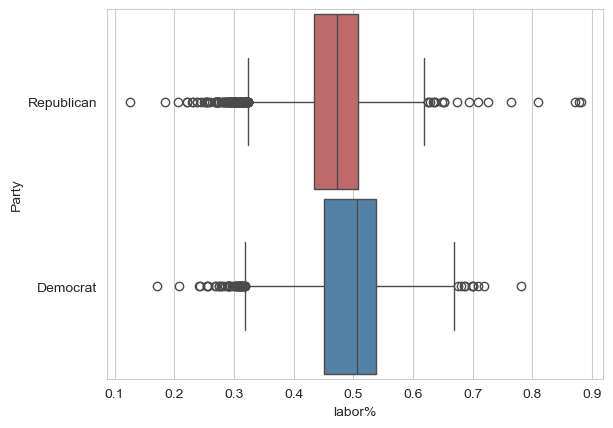

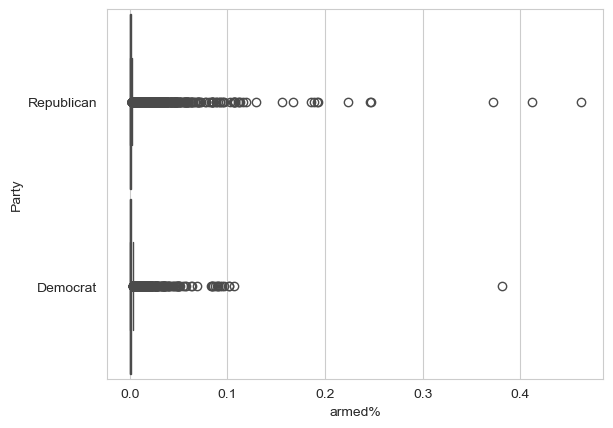

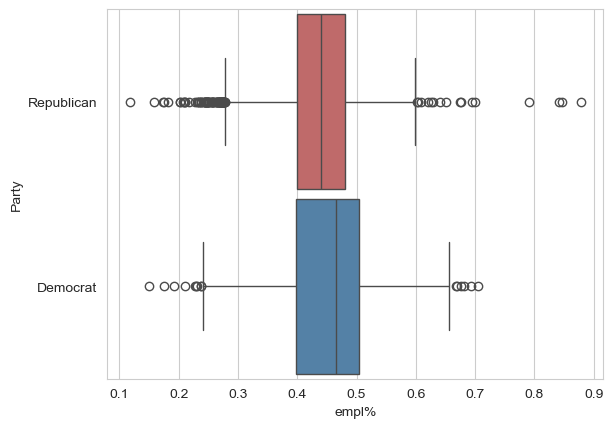

...

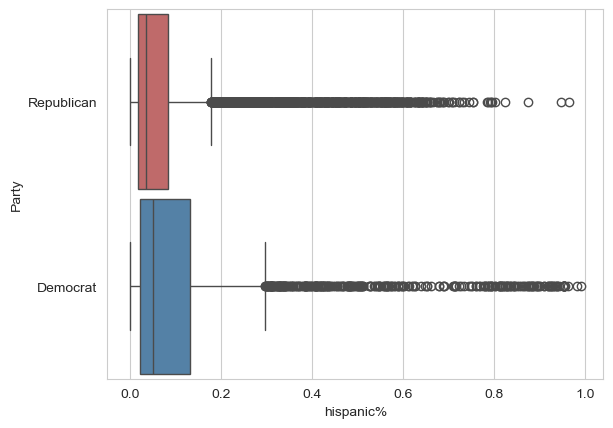

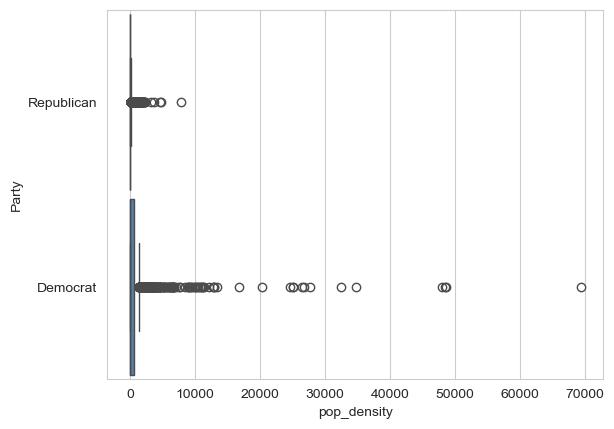

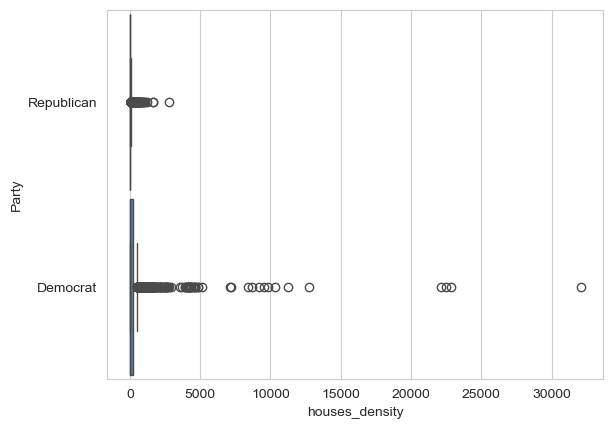

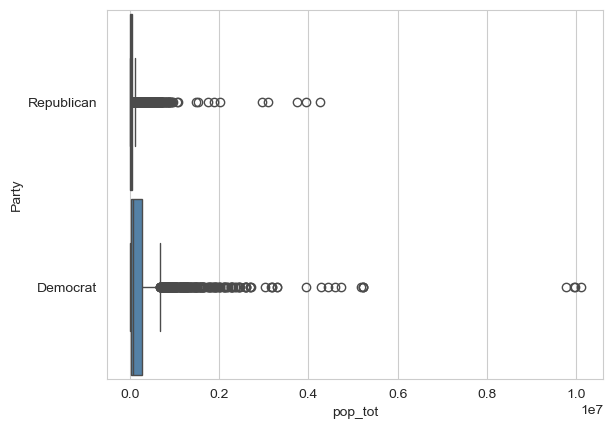

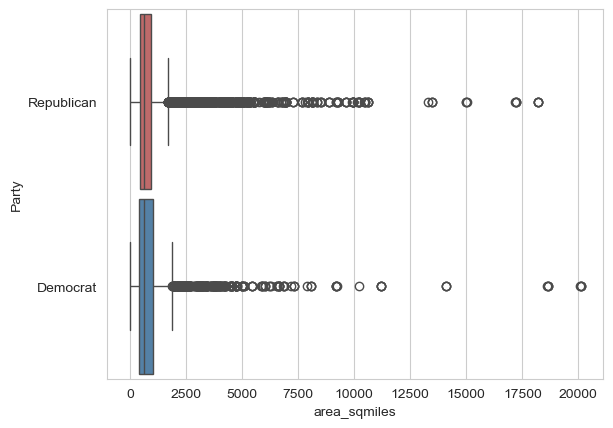

In [ ]:
plt.figure(figsize = (6, 4))

for feature in feature_list:
    sns.boxplot(data=data, 
                x=feature, 
                y='Party',
                hue='Party',
                palette={'Republican':'indianred','Democrat':'steelblue'},
                width=0.95
                )
    plt.show()

## Changes in winning party

In [ ]:
for i in range():
    for year in year_list:
        winner_over_time = [datayear[year]['y'].mean() for year in year_list]
        plt.plot(year_list, winner_over_time)

# Labels
plt.xlabel("Year", fontsize = 14)
plt.ylabel("Percentage", fontsize = 14)
# Title
plt.title("Voting over the years", fontsize = 16)
# Legend
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0, title='Feature')
# Show plot
plt.show()

ValueError: Image size of 722x977422 pixels is too large. It must be less than 2^16 in each direction.

<Figure size 640x480 with 1 Axes>

# Fool around

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


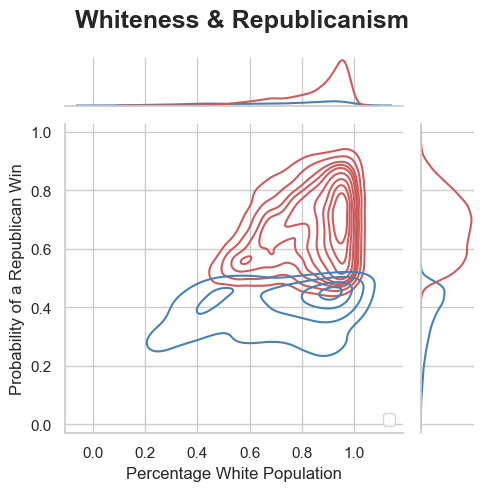

In [ ]:
g = sns.jointplot(
    data=data,
    height = 5,
    x="wht%", 
    y="repub%", 
    hue="Party",
    palette={'Republican':'indianred','Democrat':'steelblue'},
    kind="kde" )
# Set axis labels
g.set_axis_labels('Percentage White Population', 'Probability of a Republican Win')
# Set title
g.fig.suptitle("Whiteness & Republicanism", weight='bold',size=18)
g.fig.tight_layout()
plt.legend(loc='lower right')

## Density Plots by Feature

/opt/anaconda3/envs/erdos_may_2024/lib/python3.11/site-packages/seaborn/axisgrid.py:1696: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  f = plt.figure(figsize=(height, height))


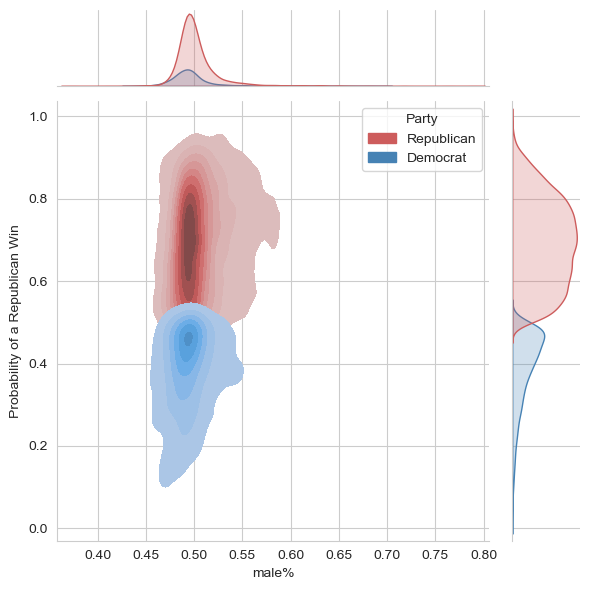

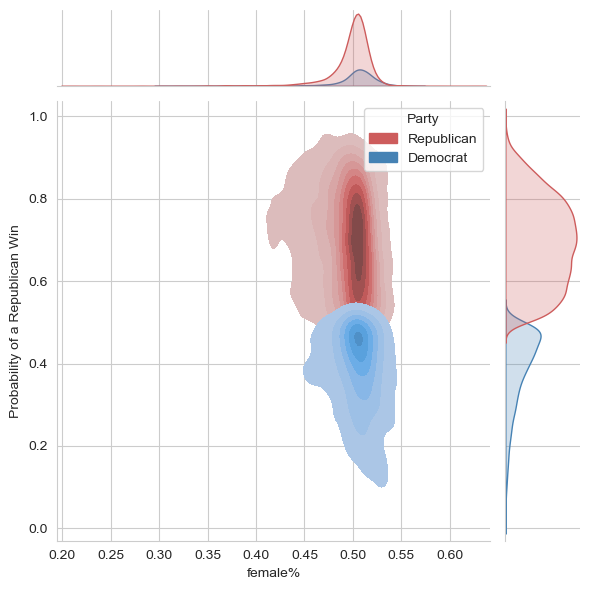

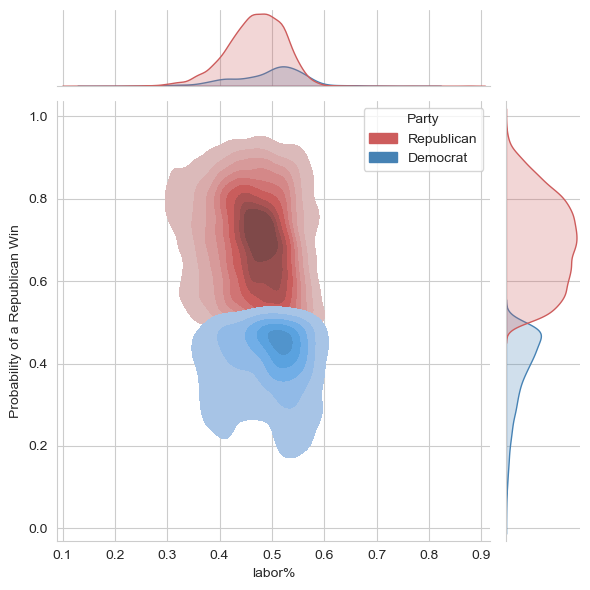

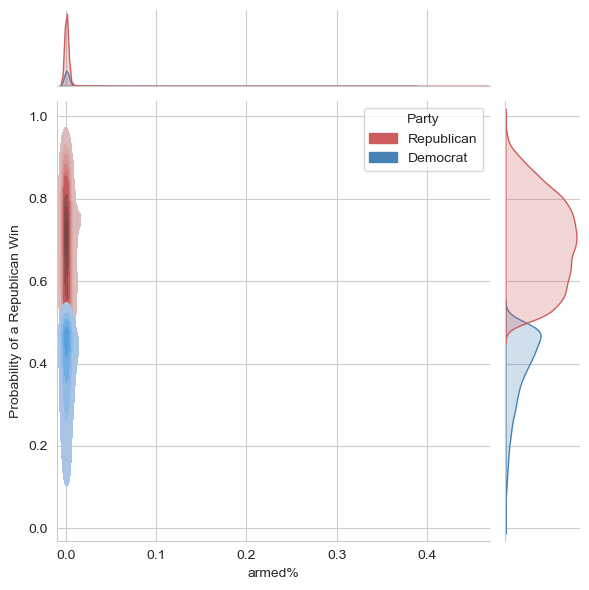

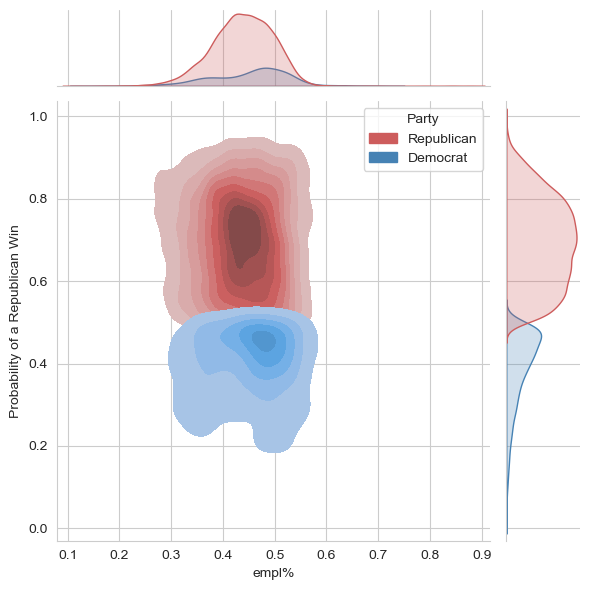

...

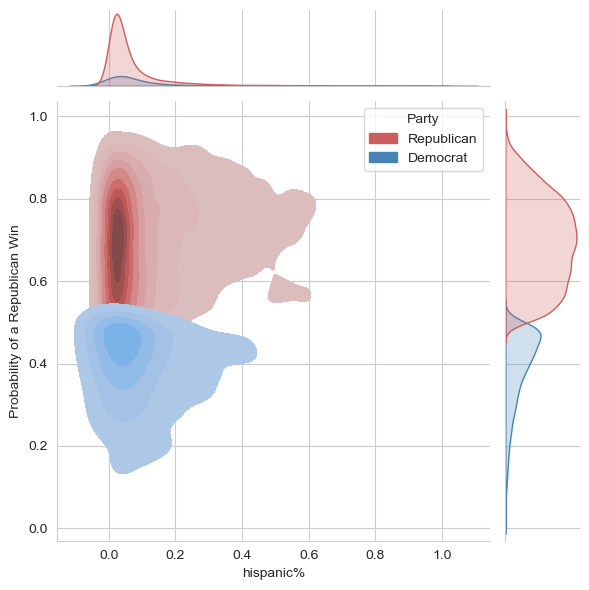

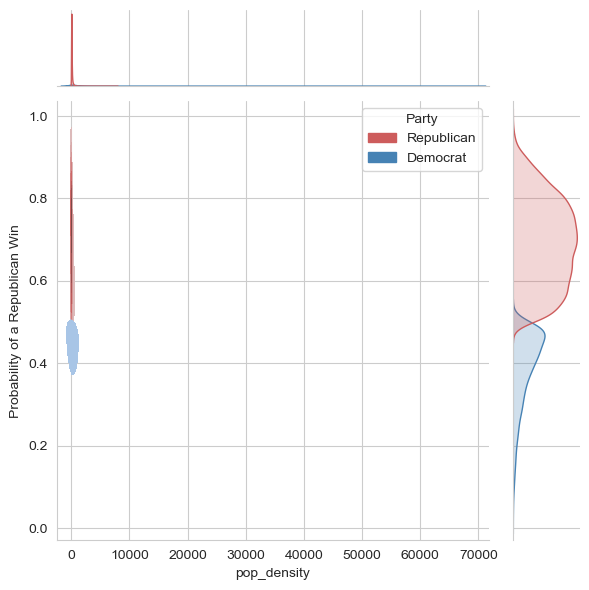

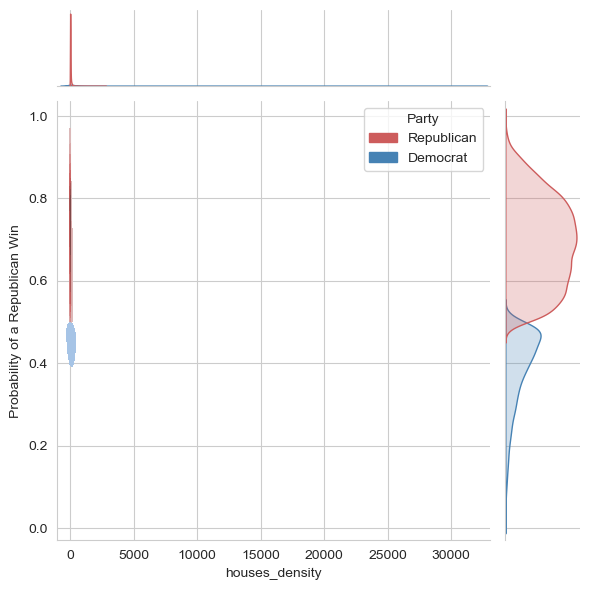

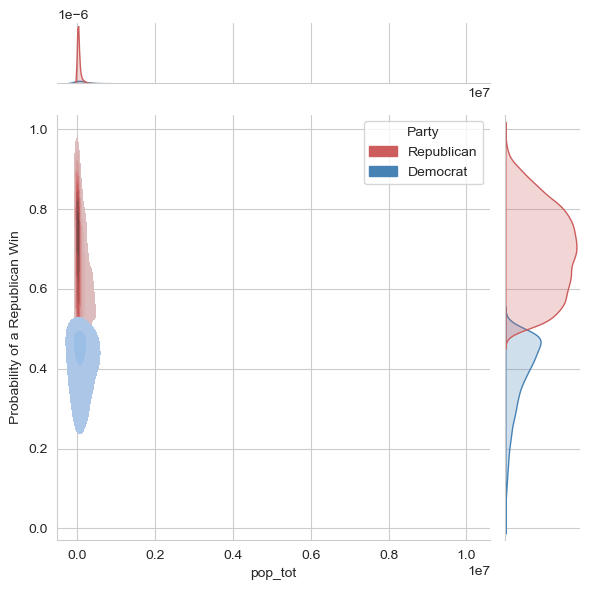

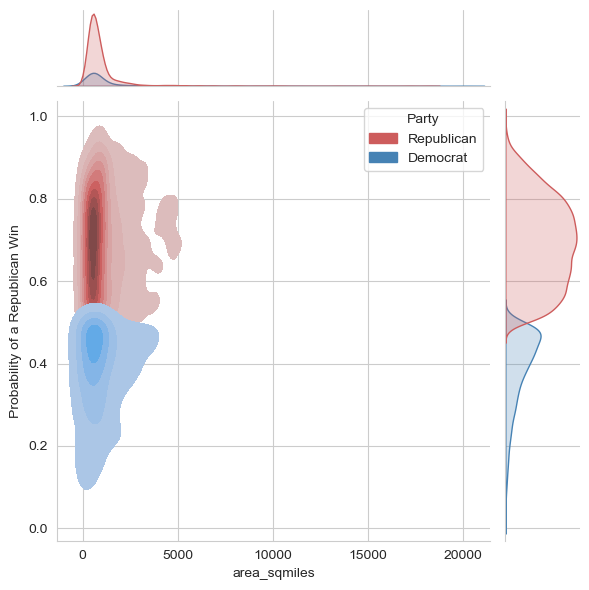

In [11]:
for feature in feature_list:
    g = sns.jointplot(
        data=data,
        height = 6,
        x=feature, 
        y="vote_prob", 
        hue="Party",
        palette={'Republican':'indianred','Democrat':'steelblue'},
        kind="kde",
        fill=True)
    # Set axis labels
    g.set_axis_labels(feature, 'Probability of a Republican Win')
    # Set title
    #g.fig.suptitle("Single & Republicanism", weight='bold',size=18)
    g.fig.tight_layout()

<Axes: xlabel='Density', ylabel='vote_prob'>

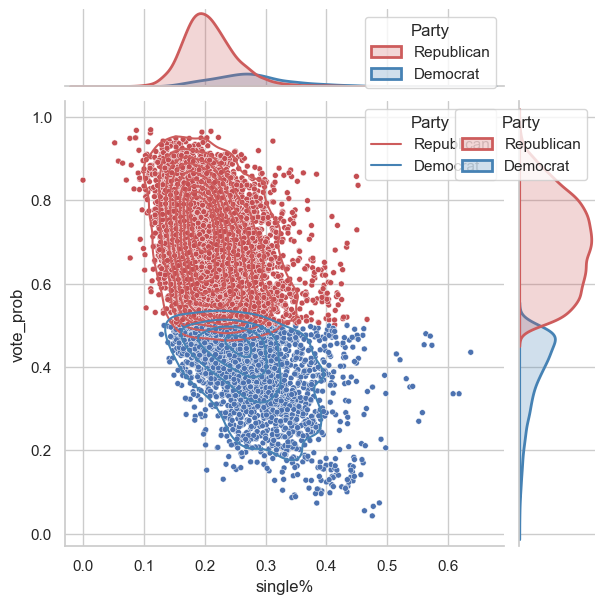

In [ ]:
g = sns.JointGrid()
x, y = data["single%"], data["vote_prob"]
sns.scatterplot(data, x='single%', y='vote_prob', hue='Party', palette={'Republican':'r','Democrat':'b'}, ax=g.ax_joint, size=0.02)
sns.kdeplot(data, x='single%', y='vote_prob',hue='Party', palette={'Republican':'indianred','Democrat':'steelblue'}, ax=g.ax_joint )
sns.kdeplot(data, x='single%', hue='Party', palette={'Republican':'indianred','Democrat':'steelblue'}, fill=True,linewidth=2, ax=g.ax_marg_x)
sns.kdeplot(data, y='vote_prob', hue='Party', palette={'Republican':'indianred','Democrat':'steelblue'}, fill=True, linewidth=2, ax=g.ax_marg_y)

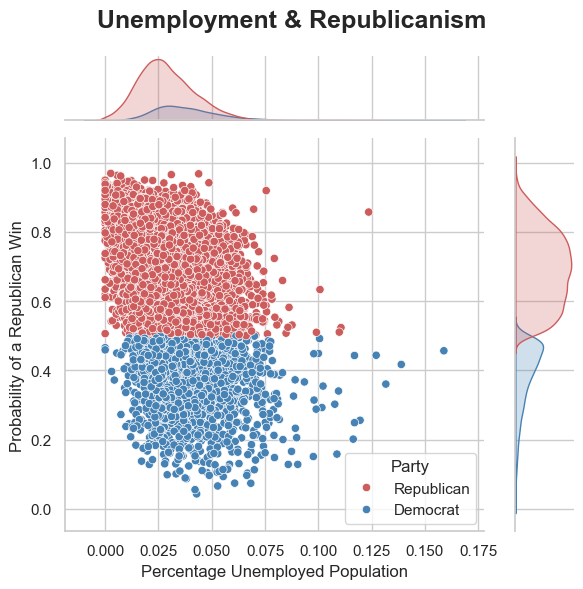

In [ ]:
g = sns.jointplot(
    data=data,
    height = 6,
    x="unempl%", 
    y="vote_prob", 
    hue="Party",
    palette={'Republican':'indianred','Democrat':'steelblue'},
    kind="scatter" )
# Set axis labels
g.set_axis_labels('Percentage Unemployed Population', 'Probability of a Republican Win')
# Set title
g.fig.suptitle("Unemployment & Republicanism", weight='bold',size=18)
g.fig.tight_layout()

In [ ]:
data[['vote_prob', 'single%']]

,vote_prob,single%
0,0.740679,0.199191
1,0.759649,0.168700
2,0.507308,0.255785
3,0.731457,0.212693
4,0.852704,0.152985
...,...,...
12419,0.761837,0.211697
12420,0.305941,0.287073
12421,0.824915,0.183247
12422,0.832906,0.182913


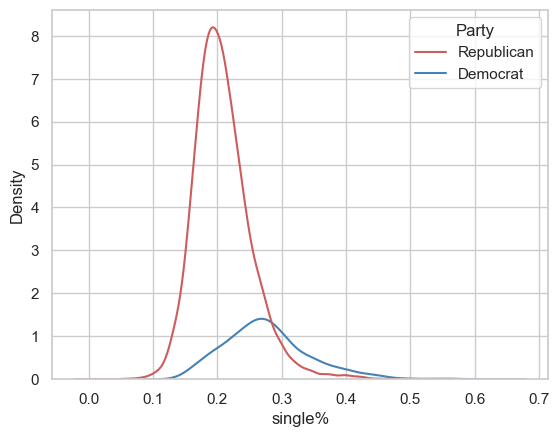

In [ ]:
g = sns.kdeplot(data, x='single%', 
                hue='Party',
                palette={'Republican':'indianred','Democrat':'steelblue'})

In [ ]:
data.columns

Index(['fips', 'y', 'vote_diff%', 'vote_prob', 'dem%', 'repub%',
       'third_party%', 'turnout', 'male%', 'female%', 'labor%', 'armed%',
       'empl%', 'unempl%', 'poverty%', 'income_median', 'income_percapita',
       'income_10%', 'income_10-15%', 'income_15-25%', 'income_25%', 'single%',
       'married%', 'marital_ratio', 'sepdiv%', 'widow%', 'edu_low%',
       'edu_mid%', 'edu_high%', 'edulow_age18%', 'edulow_age45%',
       'edulow_age65%', 'edumid_age18%', 'edumid_age45%', 'edumid_age65%',
       'eduhigh_age18%', 'eduhigh_age45%', 'eduhigh_age65%', 'age_18%',
       'age_45%', 'age_65%', 'wht%', 'wht_m%', 'wht_f%', 'blk%', 'blk_m%',
       'blk_f%', 'other%', 'other_m%', 'other_f%', 'native%', 'hispanic%',
       'pop_density', 'houses_density', 'pop_tot', 'area_sqmiles', 'year',
       'Party'],
      dtype='object')

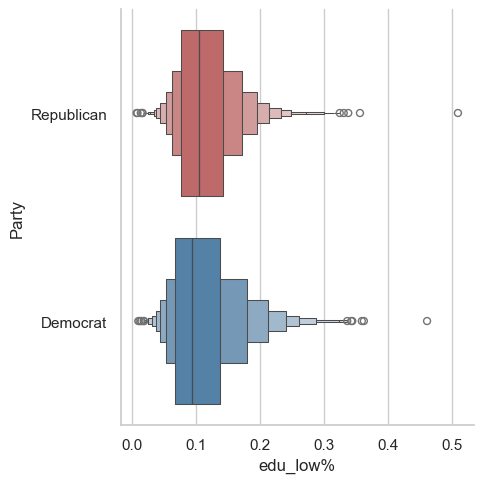

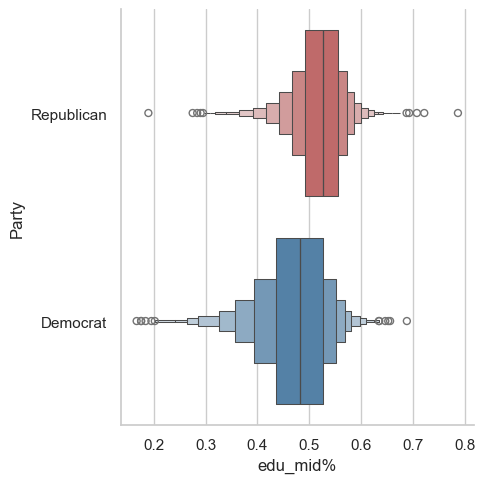

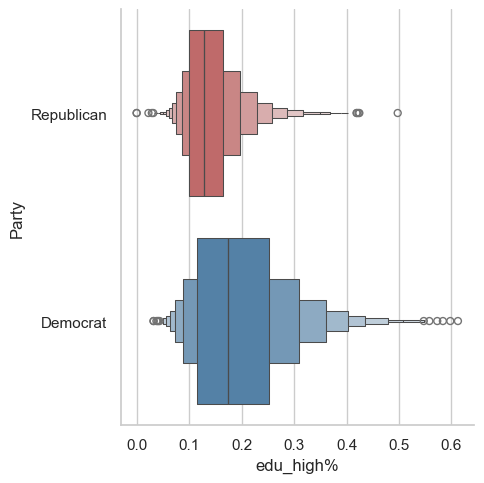

In [ ]:
for feature in ['edu_low%','edu_mid%', 'edu_high%']:
    g = sns.catplot(data=data, 
                    x=feature, 
                    y='Party',
                    kind='boxen',
                    hue='Party',
                    palette={'Republican':'indianred','Democrat':'steelblue'})


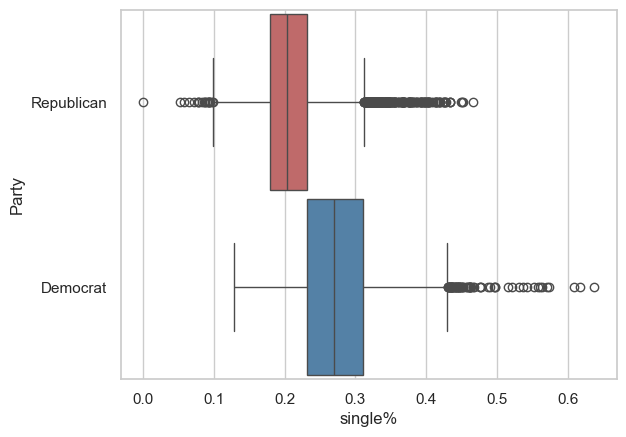

In [ ]:
features = ['single%', 'unempl%', 'wht_m%', 'eduhigh_age45%','houses_density','hispanic%']
g = sns.boxplot(data=data, 
                x='single%', 
                y='Party',
                hue='Party',
                palette={'Republican':'indianred','Democrat':'steelblue'},
                width=0.95
                )


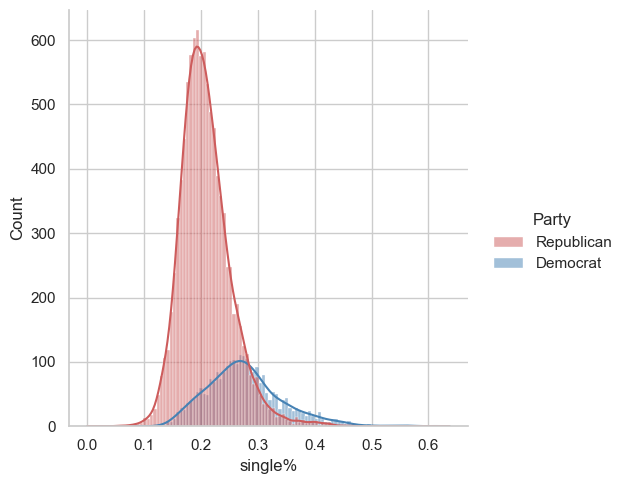

In [ ]:

sns.displot(data=data, x="single%", 
            #kind="kde",
            kde=True,
            hue='Party',
            palette={'Republican':'indianred','Democrat':'steelblue'})

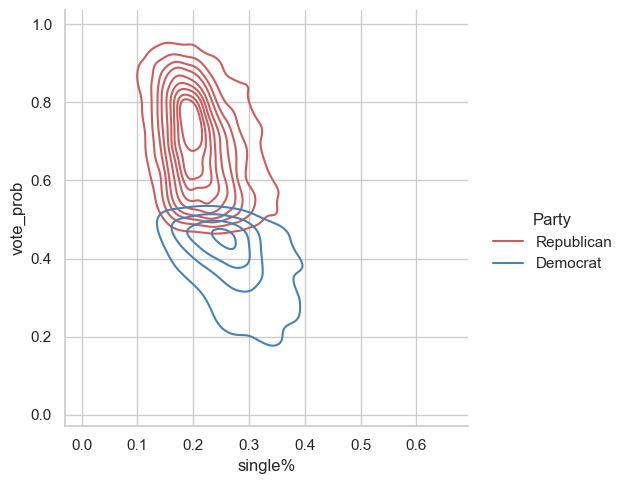

In [ ]:
sns.displot(data=data, x="single%", y="vote_prob", 
            kind="kde",
            hue='Party',
            palette={'Republican':'indianred','Democrat':'steelblue'})

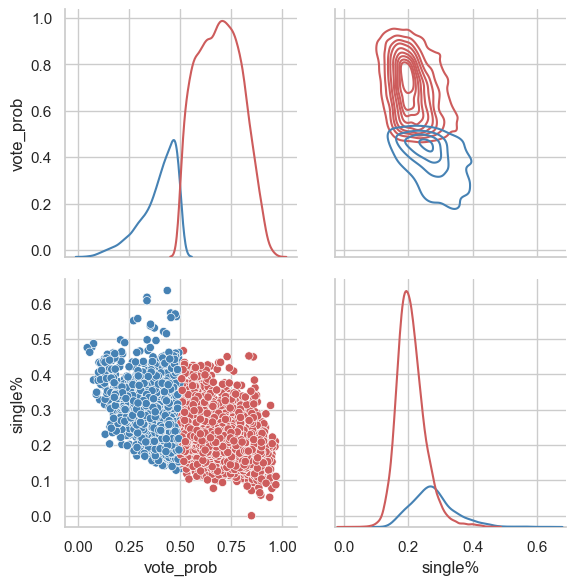

In [ ]:
g = sns.PairGrid(data, 
                diag_sharey=False,
                height=3,
                x_vars=['vote_prob', 'single%'],
                y_vars=['vote_prob', 'single%'],
                hue='Party',
                palette={'Republican':'indianred','Democrat':'steelblue'}
                )
g.map_upper(sns.kdeplot)
g.map_lower(sns.scatterplot)
g.map_diag(sns.kdeplot)